## Advanced Lane Finding Project

The goals / steps of this project are the following:

* Compute the camera calibration matrix and distortion coefficients given a set of chessboard images.
* Apply a distortion correction to raw images.
* Use color transforms, gradients, etc., to create a thresholded binary image.
* Apply a perspective transform to rectify binary image ("birds-eye view").
* Detect lane pixels and fit to find the lane boundary.
* Determine the curvature of the lane and vehicle position with respect to center.
* Warp the detected lane boundaries back onto the original image.
* Output visual display of the lane boundaries and numerical estimation of lane curvature and vehicle position.

---
## First, I'll compute the camera calibration using chessboard images

In [288]:
import numpy as np
import cv2
import glob
import matplotlib.pyplot as plt
# %matplotlib qt

def calibrate_camera(wildcard, show=False):
    # prepare object points, like (0,0,0), (1,0,0), (2,0,0) ....,(6,5,0)
    objp = np.zeros((6*9,3), np.float32)
    objp[:,:2] = np.mgrid[0:9,0:6].T.reshape(-1,2)

    # Arrays to store object points and image points from all the images.
    objpoints = [] # 3d points in real world space
    imgpoints = [] # 2d points in image plane.

    # Make a list of calibration images
    images = glob.glob(wildcard)
    shape = None

    # Step through the list and search for chessboard corners
    for fname in images:
        img = cv2.imread(fname)
        gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
        shape = gray.shape[::-1]

        # Find the chessboard corners
        ret, corners = cv2.findChessboardCorners(gray, (9,6),None)

        # If found, add object points, image points
        if ret == True:
            objpoints.append(objp)
            imgpoints.append(corners)

            # Draw and display the corners
            if show:
                img = cv2.drawChessboardCorners(img, (9,6), corners, ret)
                plt_imshow_colored(img)
                plt.show()
                
    _, mtx, dist, _, _ = cv2.calibrateCamera(objpoints, imgpoints, shape, None, None)
    return mtx, dist

mtx, dist = calibrate_camera('../camera_cal/calibration*.jpg')

def undistort(img):
    return cv2.undistort(img, mtx, dist, None, mtx)

def plt_imshow_colored(img):
    corrected = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    plt.imshow(corrected)

### Test calibration

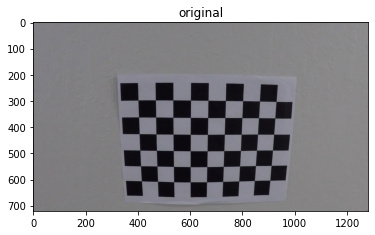

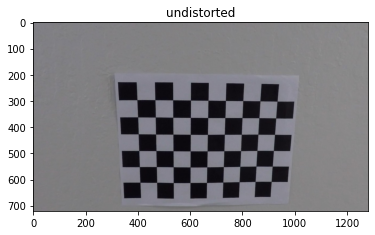

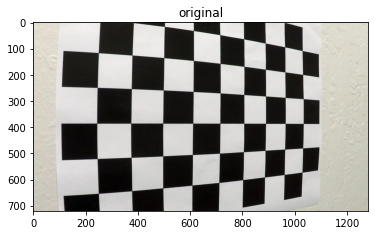

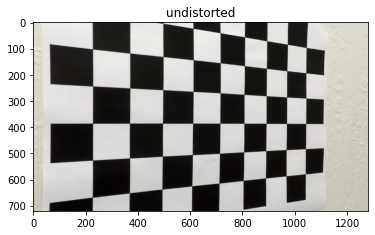

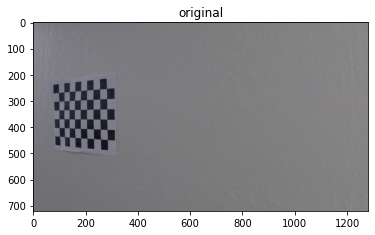

...

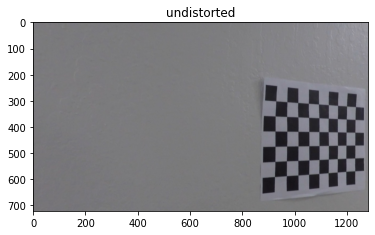

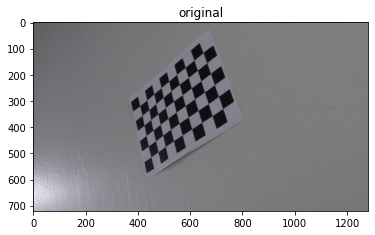

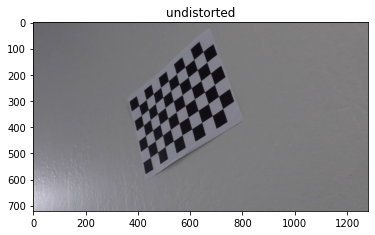

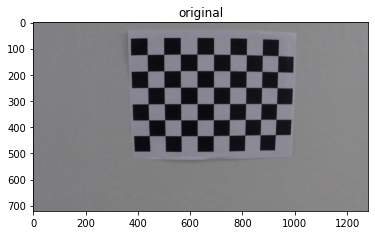

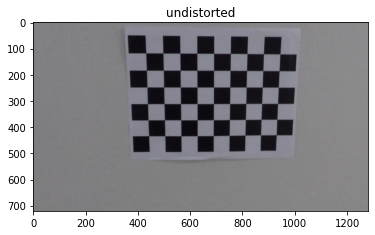

In [289]:
images = glob.glob('../camera_cal/calibration*.jpg')
for fname in images:    
    img = cv2.imread(fname)
    plt.title("original")
    plt_imshow_colored(img)
    plt.show()

    plt.title("undistorted")
    plt_imshow_colored(undistort(img))
    plt.show()

### Thresholded binary image

In [290]:
def bottom_half(img):
    w = img.shape[1]
    h = img.shape[0]
    y_top = 0.575 * h
    return np.array([[
        (0, h),
        (0, y_top),
        (w, y_top),
        (w, h)
    ]], dtype=np.int32)

def mask_image(img):
    channel_count = img.shape[2]
    ignore_mask_color = (255,) * channel_count
    mask = np.zeros_like(img)   
    cv2.fillPoly(mask, bottom_half(img), ignore_mask_color)
    return cv2.bitwise_and(img, mask)

def saturation_image(img):
    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    return hls[:,:,2]

def sobel_image(img):
    sobelx = cv2.Sobel(img, cv2.CV_64F, 1, 0)
    abs_sobelx = np.absolute(sobelx)
    return np.uint8(255 * abs_sobelx / np.max(abs_sobelx))

def binary_image(img, thresh_min, thresh_max):
    binary_img = np.zeros_like(img)
    binary_img[(img >= thresh_min) & (img <= thresh_max)] = 1
    return binary_img

def combine_binary_images(img_a, img_b):
    if (img_a.shape != img_b.shape):
        print("!! Images don't have the same shape and cannot be combined. !!")    

    combined_binary = np.zeros_like(img_a)
    combined_binary[(img_a == 1) | (img_b == 1)] = 1
    return combined_binary

def grayscale(img):
    return cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

def denoise(img):
    kernel_size = 5
    return cv2.GaussianBlur(img, (kernel_size, kernel_size), 0)

def threshold_image(img):
    img = mask_image(denoise(img))
    sat_bin = binary_image(saturation_image(img), thresh_min=170, thresh_max=255)
    sobel_bin = binary_image(grayscale(sobel_image(img)), thresh_min=30, thresh_max=100)
    combined = combine_binary_images(sat_bin, sobel_bin)

    return combined

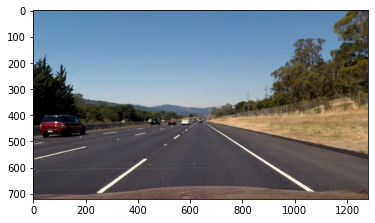

In [291]:
import os

straight_lines_fnames = glob.glob("../test_images/straight_lines2.jpg")
for fname in straight_lines_fnames:
    img = cv2.imread(fname)
    undistorted = undistort(img)

    plt.imshow(cv2.cvtColor(undistorted, cv2.COLOR_BGR2RGB))

    out_fname = f"../pipeline_example/undistorted_{os.path.basename(fname)}"
    cv2.imwrite(out_fname, undistorted)

## Perspective transformation

In [292]:
w = lane_width = 370
l = stripe_length = 300

out_width = 3 * w
out_height = 3000

ox = transform_offset_x = (out_width - lane_width) / 2
oy = transform_offset_y = 2500

src = np.float32([[431, 566], [868, 566], [1067, 698], [255, 698]])
dst = np.float32([[ox + 0, oy + 0], [ox + w, oy + 0], [ox + w, oy + l], [ox + 0, oy + l]])
M = cv2.getPerspectiveTransform(src, dst)
invM = cv2.getPerspectiveTransform(dst, src)

def top_down_transform(img):
    return cv2.warpPerspective(img, M, (out_width, out_height))

def inverse_top_down_transform(img, size):
    return cv2.warpPerspective(img, invM, size)

## TEST

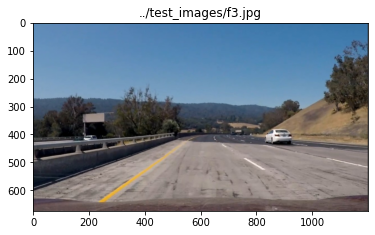

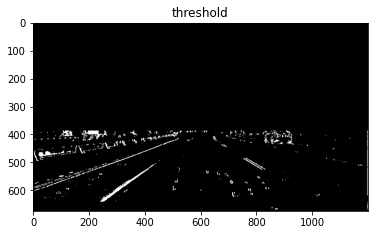

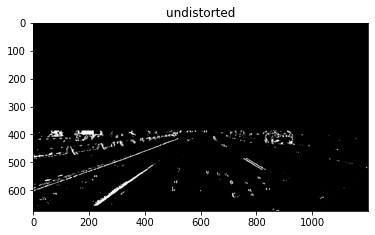

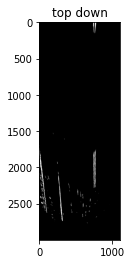

In [345]:
def test_transformation(path):
    img = cv2.imread(path)
    def show(img, title):
        plt.title(title)
        plt.imshow(img, cmap="gray")
        plt.show()

    plt.title(path)    
    plt_imshow_colored(img)
    plt.show()

    thresholded = threshold_image(img)
    show(thresholded, "threshold")

    undistorted = undistort(thresholded)
    show(undistorted, "undistorted")

    topDown = top_down_transform(undistorted)
    show(topDown, "top down")
    
images = glob.glob('../test_images/f3.jpg')
for fname in images:
    test_transformation(fname)


In [294]:
def transform(img):
    return top_down_transform(undistort(threshold_image(img)))

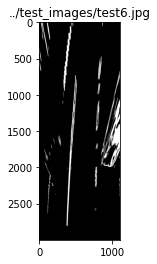

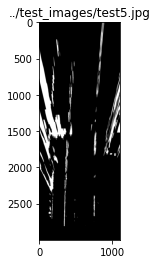

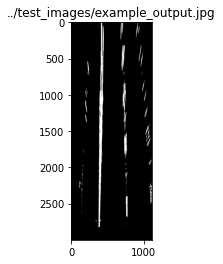

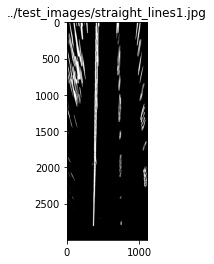

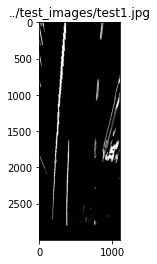

...

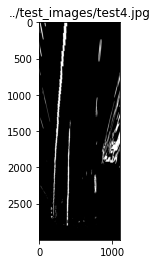

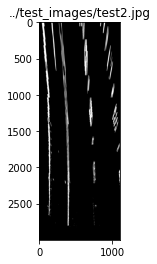

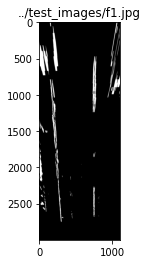

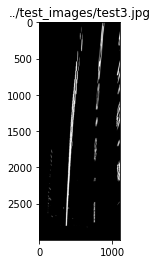

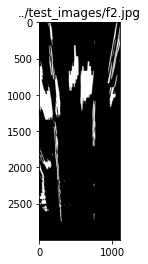

In [346]:
def test_transform(path):
    img = cv2.imread(path)
    top_down = transform(img)
    plt.title(path)
    plt.imshow(top_down, cmap='gray')
    plt.show()
    
images = glob.glob('../test_images/*.jpg')
for fname in images:
    test_transform(fname)

### Detect Lanes

In [350]:
def bottom_half_histogram(img):
    bottom_half = img[img.shape[0]//2:,:]
    raw_hist = np.sum(bottom_half, axis=0)
    w = np.array([1, 1, 1, 1, 1, 1, 1])
    hist = raw_hist
    for i in range(1):
        hist = np.convolve(w / w.sum(), hist)

    return hist

def narrow_down_hist(hist):
    w = len(hist)
    c = w // 2
    start = max(0, int(c - lane_width * 0.75))
    end = min(w, int(c + lane_width * 0.75))
    return hist[start:end], start

def find_lanes_in_hist(hist):
    hist, offset = narrow_down_hist(hist)
    mid = np.int(hist.shape[0]//2)
    left = np.argmax(hist[:mid])
    right = np.argmax(hist[mid:]) + mid
    return left + offset, right + offset

def find_lanes(img):
    hist = bottom_half_histogram(img)
    return find_lanes_in_hist(hist)

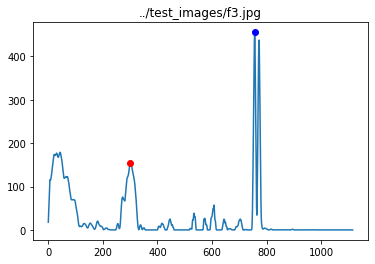

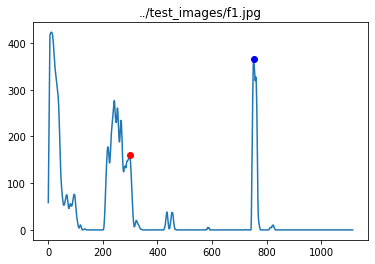

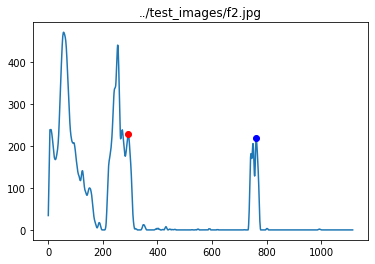

In [351]:
images = glob.glob('../test_images/f*.jpg')

for fname in images:
    img = cv2.imread(fname)
    top_down = transform(img)
    hist = bottom_half_histogram(top_down)
    left, right = find_lanes_in_hist(hist)
    
    plt.title(fname)
    plt.plot(hist)
    plt.plot(left, hist[left], "ro")
    plt.plot(right, hist[right], "bo")
    plt.show()

In [337]:
min_pix_recenter = 30
max_window_gaps = 3

def window_vertical_bounds(n, window_height, height):
    low = height - n * window_height
    high = low - window_height
    return low, high

def window_horizontal_bounds(center, width, margin = 40):
    return max(0, center - margin), min(width, center + margin)

def find_lane_pixels_sliding_window(img, lane_center, num_windows = 10):
    height, width = img.shape[0], img.shape[1]
    window_height = height // num_windows

    nonzero = img.nonzero()
    nonzero_y = np.array(nonzero[0])
    nonzero_x = np.array(nonzero[1])
    gaps = 0
    
    lane_inds = []
    
    for n in range(num_windows):
        y_bottom, y_top = window_vertical_bounds(n, window_height, height)
        x_left, x_right = window_horizontal_bounds(lane_center, width)
        
        good_inds = (
            (nonzero_x > x_left)
            & (nonzero_x < x_right)
            & (nonzero_y < y_bottom)
            & (nonzero_y > y_top)
        ).nonzero()[0]

        lane_inds.append(good_inds)
        if len(good_inds) > min_pix_recenter:
            lane_center = np.int(np.mean(nonzero_x[good_inds]))
        elif len(good_inds) == 0:
            gaps += 1
        else:
            gaps = 0

        # stop advancing if we lose track of the lane
        # (we don't want to hit the next lane)
        if gaps == max_window_gaps:
            break
           
    # extract pixel positions
    lane_inds = np.concatenate(lane_inds)    
    lane_x = nonzero_x[lane_inds]
    lane_y = nonzero_y[lane_inds]
    return lane_x, lane_y

def find_lane_polynomial(lane_x, lane_y):    
    if len(lane_x) == 0:
        print("CANNOT FIT A POLYNOMIAL - THE LANE PIXELS ARE EMPTY")
        return [0, 0, 0]
    
    return np.polyfit(lane_y, lane_x, 2)

def find_lanes_polynomials(img):    
    left, right = find_lanes(img)
    
    lane_x, lane_y = find_lane_pixels_sliding_window(img, left)
    left_poly = find_lane_polynomial(lane_x, lane_y)
    
    lane_x, lane_y = find_lane_pixels_sliding_window(img, right)
    right_poly = find_lane_polynomial(lane_x, lane_y)

    return left_poly, right_poly

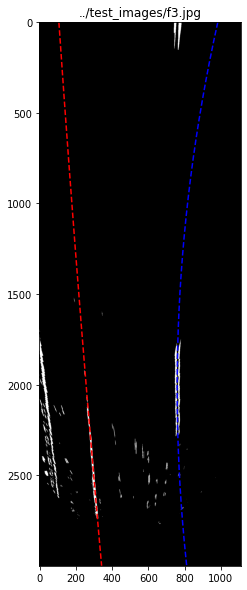

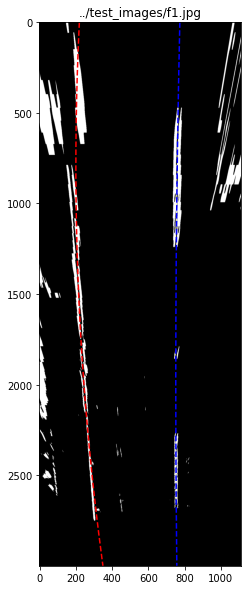

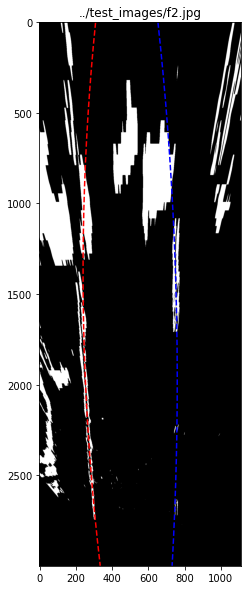

In [352]:
images = glob.glob('../test_images/f*.jpg')

for fname in images:
    img = cv2.imread(fname)
    top_down = transform(img)
    left_poly, right_poly = find_lanes_polynomials(top_down)

    height = top_down.shape[0]
    y = np.linspace(0, height - 1, height)
    x_l = left_poly[0]*y**2 + left_poly[1]*y + left_poly[2]
    x_r = right_poly[0]*y**2 + right_poly[1]*y + right_poly[2]
    
    plt.figure(figsize=(5, 10))
    plt.title(fname)
    plt.plot(x_l, y, "r--")
    plt.plot(x_r, y, "b--")
    plt.imshow(top_down, cmap="gray")
    plt.show()

In [300]:
def eval_poly(p, length):
    y = np.linspace(0, length - 1, length)
    x = p[0] * y**2 + p[1] * y + p[2]
    return x, y

def find_lane_pixels_around_polynomial(img, poly, margin = 40):
    # find indexes of all white pixels around the previous polynomial
    nonzero = img.nonzero()
    nonzero_y = np.array(nonzero[0])
    nonzero_x = np.array(nonzero[1])
    inds = (np.abs(nonzero_x - (poly[0]*(nonzero_y**2) + poly[1]*nonzero_y + poly[2])) < margin)
    
    # extract lane pixel positions
    lane_x = nonzero_x[inds]
    lane_y = nonzero_y[inds]
    return lane_x, lane_y

def find_lane_polynomial_from_prev(img, prev_poly):
    lane_x, lane_y = find_lane_pixels_around_polynomial(img, prev_poly)
    return find_lane_polynomial(lane_x, lane_y)
    
def find_lanes_polynomials_from_prev(img, prev_left_poly, prev_right_poly):
    left_poly = find_lane_polynomial_from_prev(img, prev_left_poly)
    right_poly = find_lane_polynomial_from_prev(img, prev_right_poly)
    return left_poly, right_poly

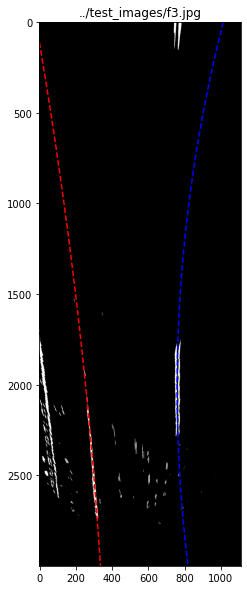

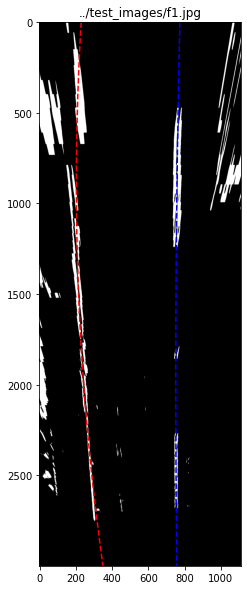

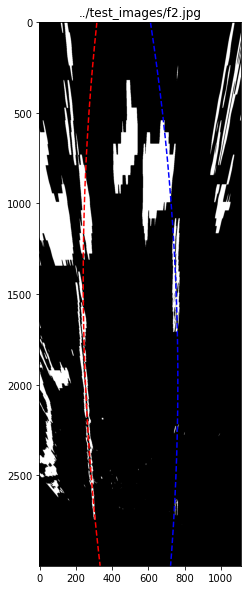

In [353]:
images = glob.glob('../test_images/f*.jpg')

for fname in images:
    img = cv2.imread(fname)
    top_down = transform(img)
    prev_left_poly, prev_right_poly = find_lanes_polynomials(top_down)
    left_poly, right_poly = find_lanes_polynomials_from_prev(top_down, prev_left_poly, prev_right_poly)

    height = top_down.shape[0]
    x_l, y = eval_poly(left_poly, height)
    x_r, _ = eval_poly(right_poly, height)
    
    plt.figure(figsize=(5, 10))
    plt.title(fname)
    plt.plot(x_l, y, "r--")
    plt.plot(x_r, y, "b--")
    plt.imshow(top_down, cmap="gray")
    plt.show()

### Draw lanes onto the original image

In [302]:
red = [255, 0, 0]
green = [0, 255, 0]
blue = [0, 0, 255]

def color_pixels_along_poly(img, poly, color, margin = 40):
    lane_x, lane_y = find_lane_pixels_around_polynomial(img, poly, margin)
    zeros = np.zeros_like(img)
    out_img = np.dstack((zeros, zeros, zeros))
    out_img[lane_y, lane_x] = color
    return out_img

def color_lane_between_polys(img, left_poly, right_poly, color):
    height = img.shape[0]
    x_l, y = eval_poly(left_poly, height)
    x_r, _ = eval_poly(right_poly, height)
    
    left_bound = np.array([np.transpose(np.vstack([x_l, y]))])
    right_bound = np.array([np.flipud(np.transpose(np.vstack([x_r, y])))])
    polygon = np.hstack((left_bound, right_bound))

    zeros = np.zeros_like(img)
    out_img = np.dstack((zeros, zeros, zeros))
    cv2.fillPoly(out_img, np.int_([polygon]), color)
    return out_img
    
def draw_lanes(img, left_lane_poly, right_lane_poly):
    left_lane_marked = color_pixels_along_poly(img, left_lane_poly, color = red)
    right_lane_marked = color_pixels_along_poly(img, right_lane_poly, color = blue)
    
    zeros = np.zeros_like(img)
    out_img = np.dstack((zeros, zeros, zeros))
        
    colored_bounds = cv2.addWeighted(left_lane_marked, 1, right_lane_marked, 1, 0)
    colored_lane = color_lane_between_polys(img, left_lane_poly, right_lane_poly, green)
    return cv2.addWeighted(colored_bounds, 1, colored_lane, 0.3, 0)

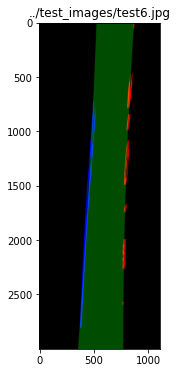

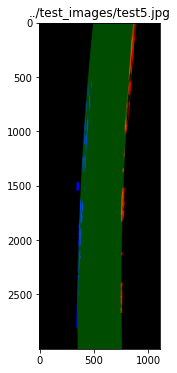

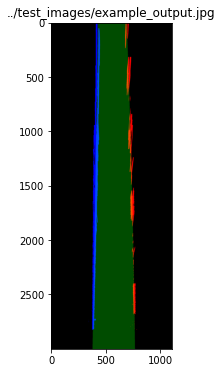

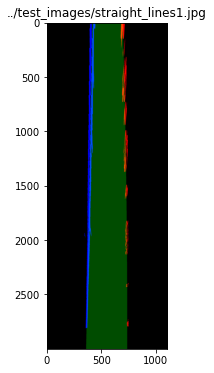

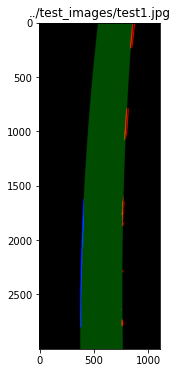

...

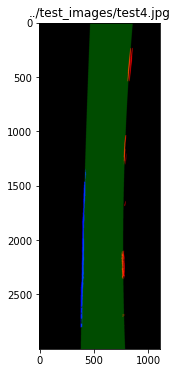

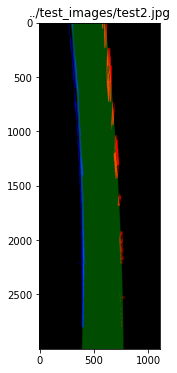

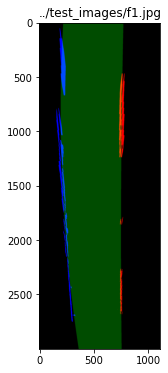

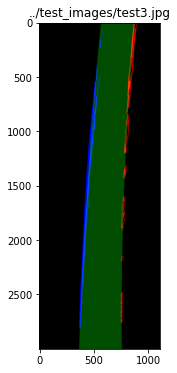

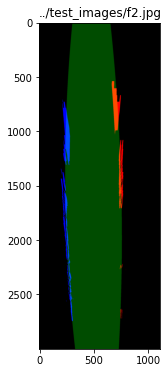

In [340]:
images = glob.glob('../test_images/f*.jpg')

for fname in images:
    img = cv2.imread(fname)

    top_down = transform(img)
    left_poly, right_poly = find_lanes_polynomials(top_down)    
    out_img = draw_lanes(top_down, left_poly, right_poly)
    
    plt.figure(figsize=(3, 6))
    plt.title(fname)
    plt_imshow_colored(out_img)
    plt.show()

## Combine the final picture with the original picture with correct perspective transformation

In [304]:
def draw_result(orig_img, markings_img):
    height = orig_img.shape[0]
    width = orig_img.shape[1]
    size = (width, height)    
    warped_markings_img = inverse_top_down_transform(markings_img, size)
    return cv2.addWeighted(undistort(orig_img), 1, warped_markings_img, 1, 0)

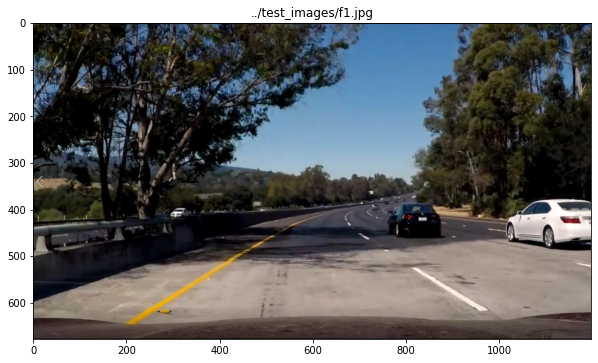

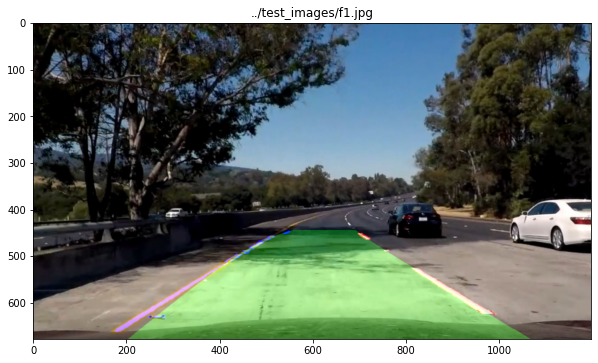

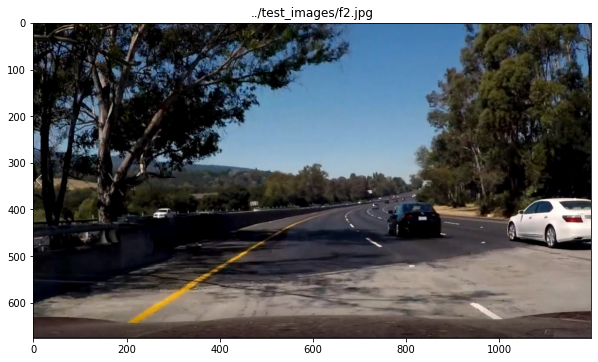

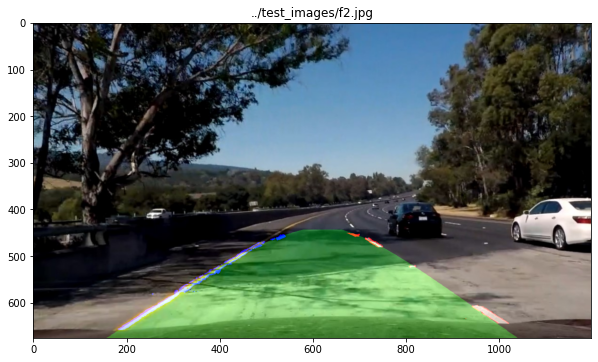

In [341]:
images = glob.glob("../test_images/f*.jpg")
for fname in images:
    img = cv2.imread(fname)

    top_down = transform(img)
    left_poly, right_poly = find_lanes_polynomials(top_down)    
    markings_img = draw_lanes(top_down, left_poly, right_poly)
    out_img = draw_result(img, markings_img)
    
    plt.figure(figsize=(10, 20))
    plt.title(fname)
    plt_imshow_colored(img)
    plt.show()
    
    plt.figure(figsize=(10, 20))
    plt.title(fname)
    plt_imshow_colored(out_img)
    plt.show()


### Measuring Road Curvature

In [317]:
# thanks to the top-down transformation, 1px in the top-down image
# corresponds to 1cm in real world
mx = 0.01
my = 0.01

def calculate_curvature_for_poly(a, b, y):
    nominator = np.sqrt((1 + (2*a*y + b) ** 2) ** 3)
    denominator = np.abs(2*a)
    return nominator / denominator

def convert_poly_to_worldspace(poly):
    a = mx / (my ** 2) * poly[0]
    b = mx / my * poly[1]
    return a, b

def calculate_curvature(poly, y):
    a, b = convert_poly_to_worldspace(poly)
    y_worldspace = y * my
    return calculate_curvature_for_poly(a, b, y_worldspace)

def average_curvature(left_poly, right_poly, y):
    left_curvature = calculate_curvature(left_poly, y)
    right_curvature = calculate_curvature(right_poly, y)
    return (left_curvature + right_curvature) / 2

def print_curvature(curvature_radius):
    return "Radius of Curvature = {:.0f}(m)".format(curvature_radius)

../test_images/example_output.jpg
Radius of Curvature = 4870(m)


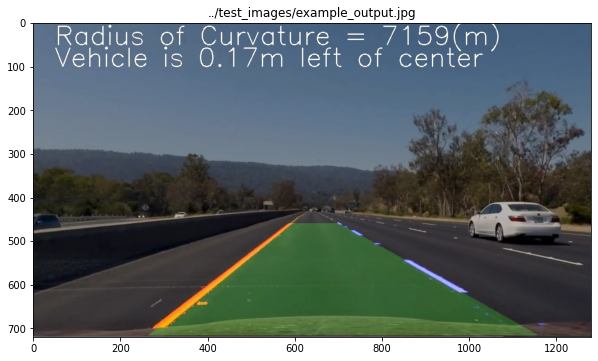

In [318]:
def test_calculate_curvature(fname):
    img = cv2.imread(fname)

    top_down = transform(img)
    left_poly, right_poly = find_lanes_polynomials(top_down)    

    y_max = top_down.shape[0]
    curvature = average_curvature(left_poly, right_poly, y_max)
    
    print(fname)
    print(print_curvature(curvature))
    
    plt.figure(figsize=(10, 20))
    plt.title(fname)
    plt_imshow_colored(img)
    plt.show()
    

# for fname in images:
#     test_calculate_curvature(fname)

test_calculate_curvature("../test_images/example_output.jpg")

## Calculate off-center distance

In [326]:
lane_marking_width = 0.15 # m

def calculate_lane_bounds(left_poly, right_poly, y):
    def eval_poly(p):
        return p[0] * y ** 2 + p[1] * y + p[2]
    
    return eval_poly(left_poly), eval_poly(right_poly)

def apply_lane_marking_offset(x_l_px, x_r_px):
    off = (lane_marking_width / mx) / 2
    return x_l_px + off, x_r_px - off

def calculate_off_center_distance(left_poly, right_poly, y):
    x_l, x_r = calculate_lane_bounds(left_poly, right_poly, y)
    x_l, x_r = apply_lane_marking_offset(x_l, x_r)
    
    # thanks to the way the top-down perspective transform is performed
    # we would expect the `ox` pixel of the top-down image to be aligned
    # with the center of the left lane mark and `ox + lane_width`
    # to be aligned with the center of the right lane marking
    off_l = x_l - ox
    off_r = x_r - lane_width - ox

    off_px = (off_l + off_r) / 2
    return off_px * mx

def print_off_center_distance(off):
    side = "left" if off > 0 else "right"
    return "Vehicle is {:.2f}m {} of center".format(np.abs(off), side)

In [327]:
def test_off_center_distance(fname):
    img = cv2.imread(fname)

    top_down = transform(img)
    left_poly, right_poly = find_lanes_polynomials(top_down)  

    y_max = top_down.shape[0]
    off = calculate_off_center_distance(left_poly, right_poly, y_max)
    print(print_off_center_distance(off))

# for fname in images:
#     test_off_center_distance(fname)

test_off_center_distance("../test_images/example_output.jpg")

Vehicle is 0.21m left of center


In [328]:
def draw_text(img, offset, curvature):
    curvature_msg = print_curvature(curvature)
    off_msg = print_off_center_distance(offset)

    def draw_line(text, origin):    
        cv2.putText(img, text, origin, cv2.FONT_HERSHEY_SIMPLEX, 1, (255, 255, 255), 2, cv2.LINE_AA) 
        
    draw_line(curvature_msg, (50, 50))
    draw_line(off_msg, (50, 90))

## Image processing pipeline

In [329]:
def process_image(img):
    top_down = transform(img)
    left_poly, right_poly = find_lanes_polynomials(top_down)    

    y_eval = top_down.shape[0]
    curvature = average_curvature(left_poly, right_poly, y_eval)
    off = calculate_off_center_distance(left_poly, right_poly, y_eval)
    
    markings_img = draw_lanes(top_down, left_poly, right_poly)
    out_img = draw_result(img, markings_img)
    draw_text(out_img, off, curvature)
    
    return out_img

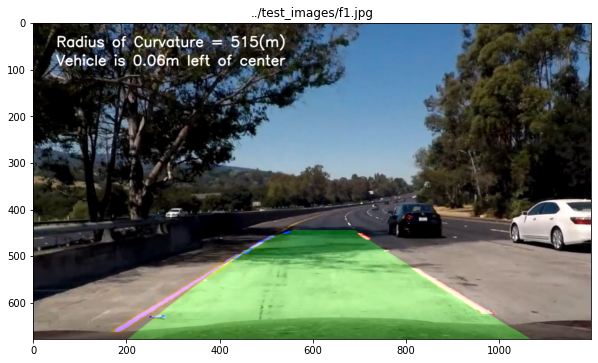

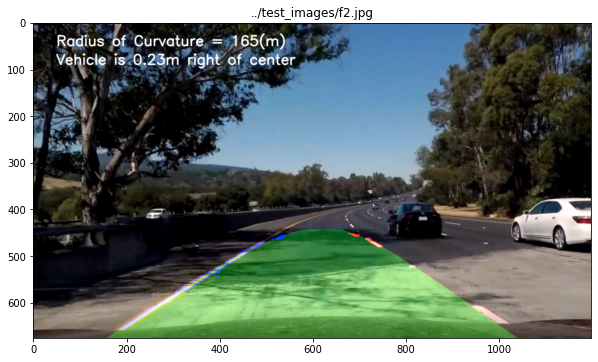

In [342]:
import os

for fname in images:
    img = cv2.imread(fname)
    out = process_image(img)

    plt.figure(figsize=(10, 20))
    plt.title(fname)
    plt_imshow_colored(out)
    plt.show()

    file_name = os.path.basename(fname)
    out_name = "../output_images/{}".format(file_name)
    cv2.imwrite(out_name, out)

## Video processing

In [343]:
from moviepy.editor import VideoFileClip

def process_video(vname):
    out_name = "../output_videos/" + os.path.basename(vname)
    clip = VideoFileClip(vname)
    out_clip = clip.fl_image(process_image)
    %time out_clip.write_videofile(out_name, audio=False)
    
videos = glob.glob("../*.mp4")
for vname in videos:
    process_video(vname)

t:   0%|          | 2/1260 [00:00<01:58, 10.63it/s, now=None]Moviepy - Building video ../output_videos/project_video.mp4.
Moviepy - Writing video ../output_videos/project_video.mp4

t: 100%|██████████| 1260/1260 [03:17<00:00,  6.38it/s, now=None]Moviepy - Done !
Moviepy - video ready ../output_videos/project_video.mp4
CPU times: user 8min 57s, sys: 1min 12s, total: 10min 9s
Wall time: 3min 17s
t:   0%|          | 2/485 [00:00<00:41, 11.64it/s, now=None]Moviepy - Building video ../output_videos/challenge_video.mp4.
Moviepy - Writing video ../output_videos/challenge_video.mp4

t:  27%|██▋       | 133/485 [00:19<00:49,  7.06it/s, now=None]CANNOT FIT A POLYNOMIAL - THE LANE PIXELS ARE EMPTY
CANNOT FIT A POLYNOMIAL - THE LANE PIXELS ARE EMPTY
t:  28%|██▊       | 138/485 [00:19<00:49,  6.99it/s, now=None]CANNOT FIT A POLYNOMIAL - THE LANE PIXELS ARE EMPTY
CANNOT FIT A POLYNOMIAL - THE LANE PIXELS ARE EMPTY
t:  29%|██▉       | 140/485 [00:20<00:49,  6.90it/s, now=None]CANNOT FIT A POLYNOMIAL 